In [42]:
from scipy.signal import butter, lfilter
from scipy.signal import freqz
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a
def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y
fs = 800.0

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

In [44]:
Data = []
Data_filtered = []
for i in range(2,6):
    data = pd.read_csv(f'data\\{i}.csv', sep=';', header = None) 
    data.columns = ["X", "Y", "Y1", "Z"]
    data = data[['X', 'Y', 'Z']]
    data = data[:60000]
    Data.append(data)

In [91]:


def steps_amplitude(BOUND, data, steps, rubbish):
    a = 35
    b = 65
    c = 0
    for i in range(5):
        fig1 = plt.figure(figsize= (30,10))
        axes = fig1.add_axes([0.2,0.1,1,1])
        axes.plot(data.Z[10000*i:10000*(i+1)])
        j = 35 + i*10000
        while(j <(i+1)*10000 - 100):
            temp = np.array(data.Z[j:j+100])
            if(max(abs(temp)) > BOUND[i]):
                r = np.argmax(abs(temp))
                axes.plot(range(j+r-a,j+r+b),data[j+r-a:j+r+b], c='r')
                stepsx = np.array(data.X[j+r-a:j+r+b])
                stepsy = np.array(data.Y[j+r-a:j+r+b])
                stepsz = np.array(data.Z[j+r-a:j+r+b])
                steps.append(np.concatenate((stepsx, stepsy, stepsz), axis = 0))
                rubbishx = np.array(data.X[j+r+b+5:j+r+b+105])
                rubbishy = np.array(data.Y[j+r+b + 5:j+r+b + 105])
                rubbishz = np.array(data.Z[j+r+b + 5:j+r+b + 105])
                rubbish.append(np.concatenate((rubbishx, rubbishy, rubbishz), axis = 0))
                j = j + r + 100
                
            j = j + 1
    return steps, rubbish
def drow( data):
    fig1 = plt.figure(figsize= (30,10))
    axes = fig1.add_axes([0.2,0.1,1,1])
    axes.plot( range(100), data[:100], c = "r")
    axes.plot( range(100), data[100:200], c = "b")
    axes.plot( range(100), data[200:], c = "g")

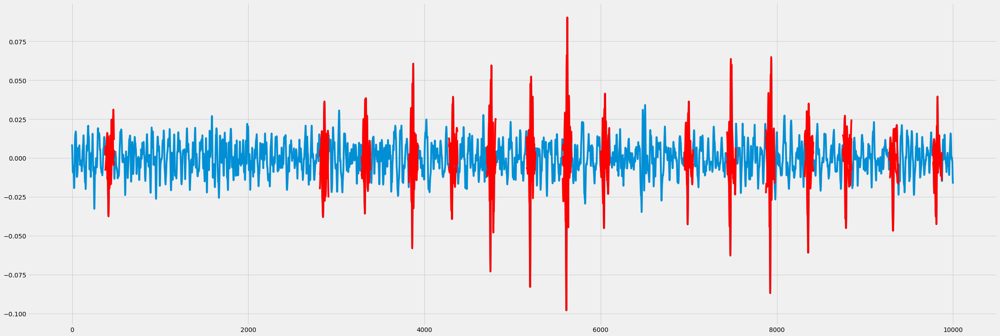

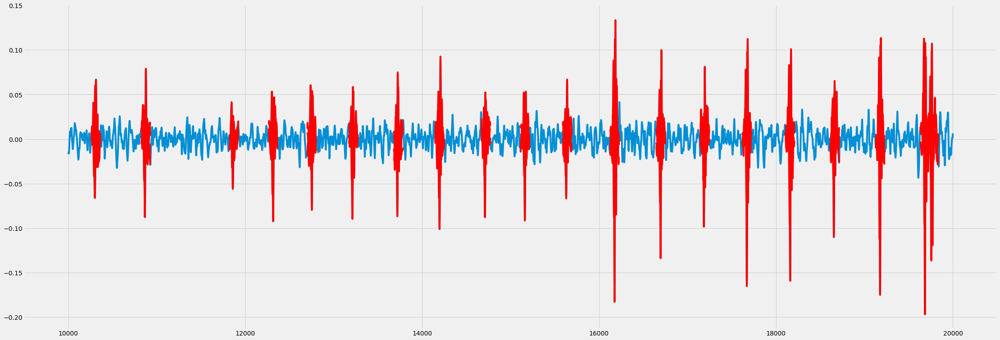

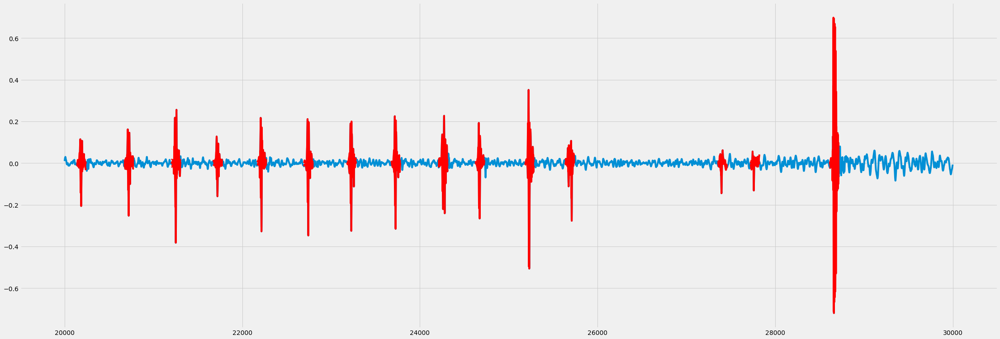

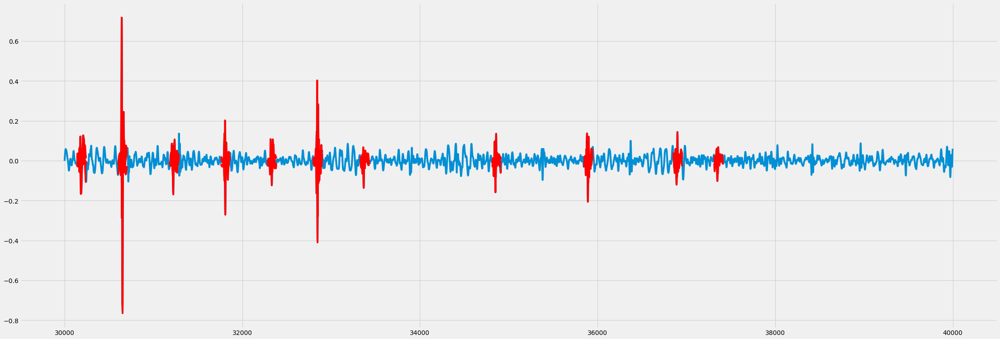

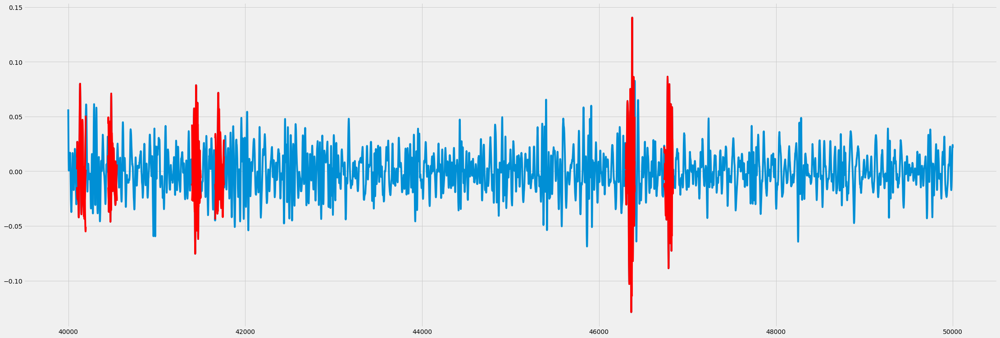

In [46]:
BOUND = [0.035, 0.05, 0.1, 0.1, 0.07]
steps = []
rubbish = []
steps1, rubbish1 = steps_amplitude(BOUND, Data[0], steps, rubbish)

In [93]:
steps1.shape

(325, 301)

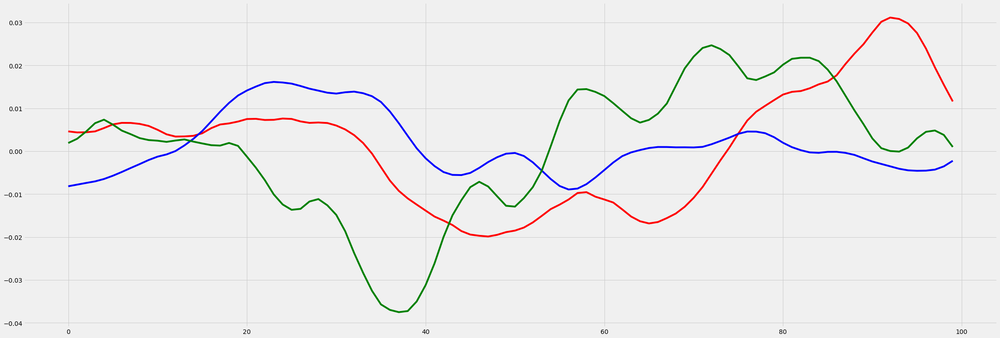

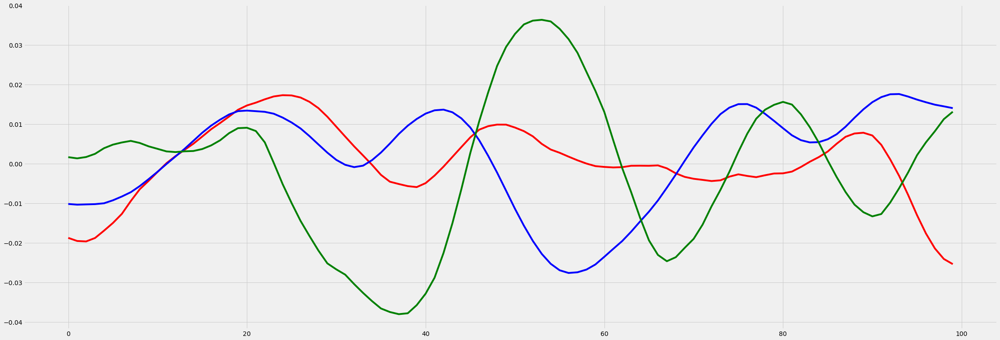

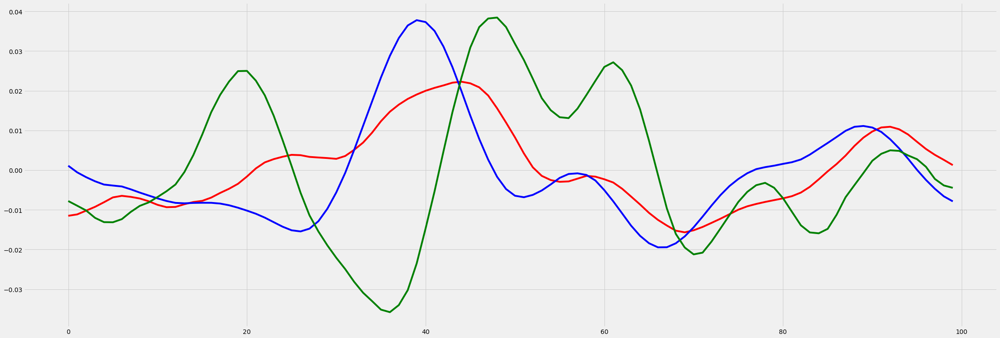

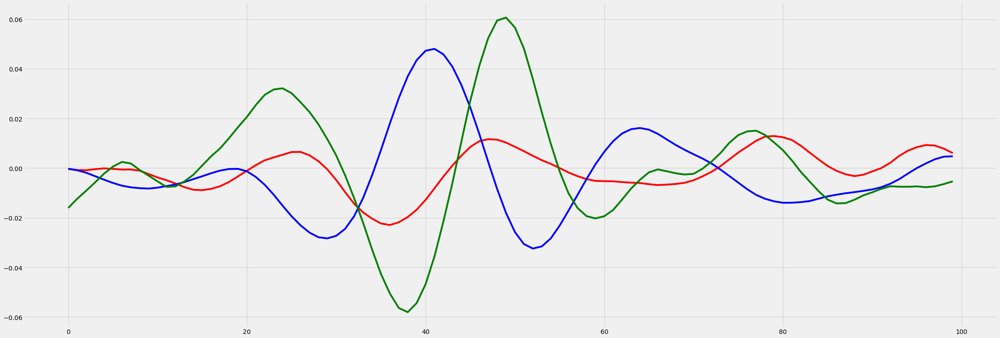

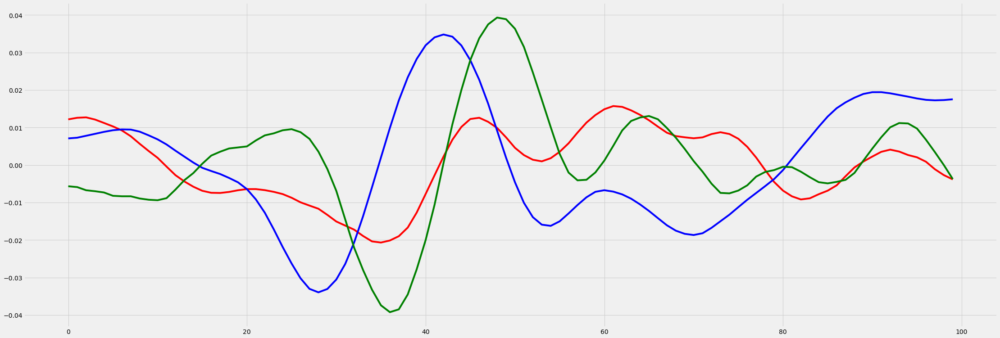

...

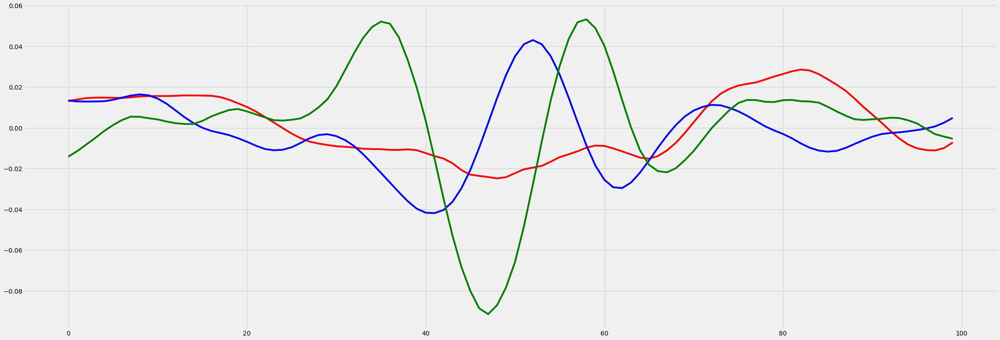

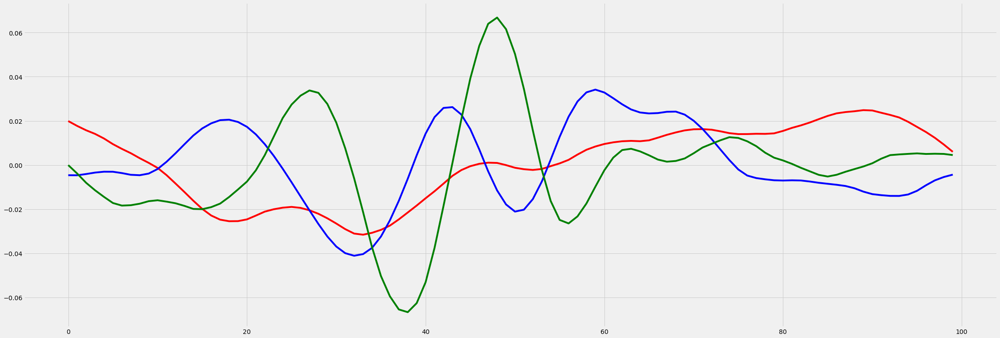

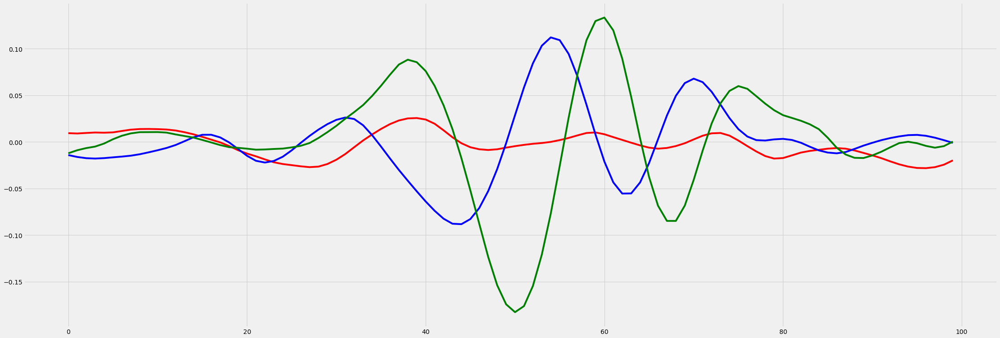

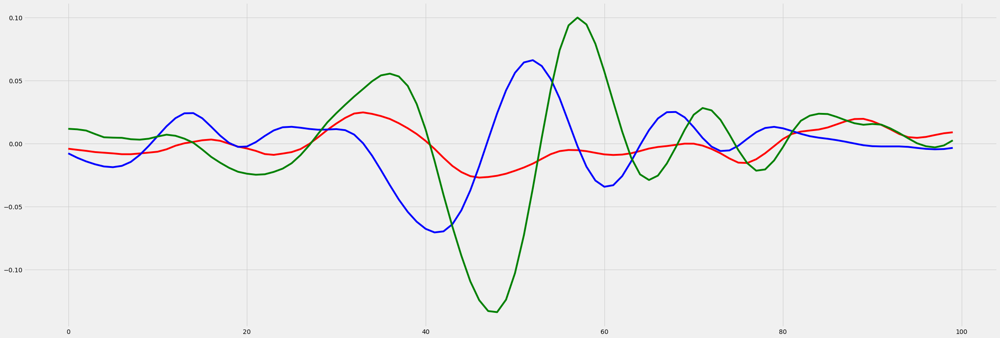

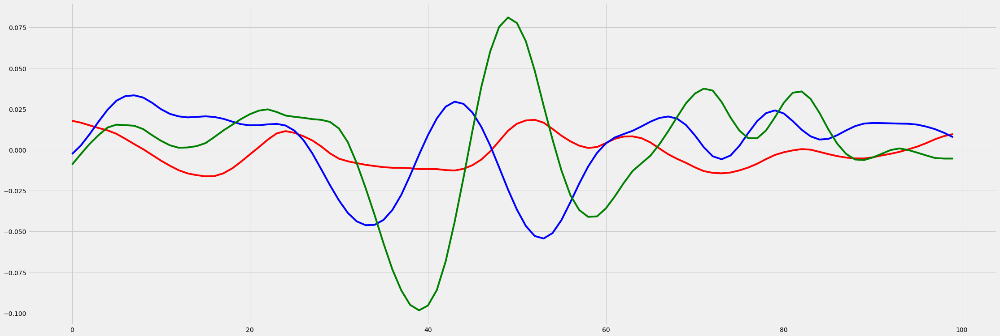

In [94]:
for i in steps1[:30, :300]:
    drow(i)

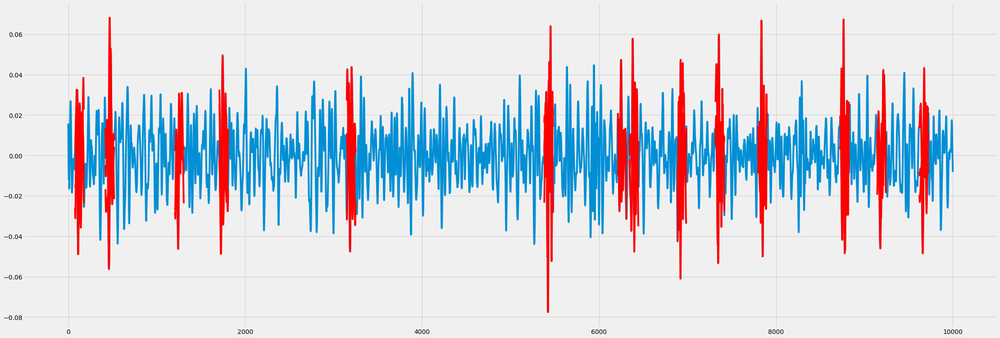

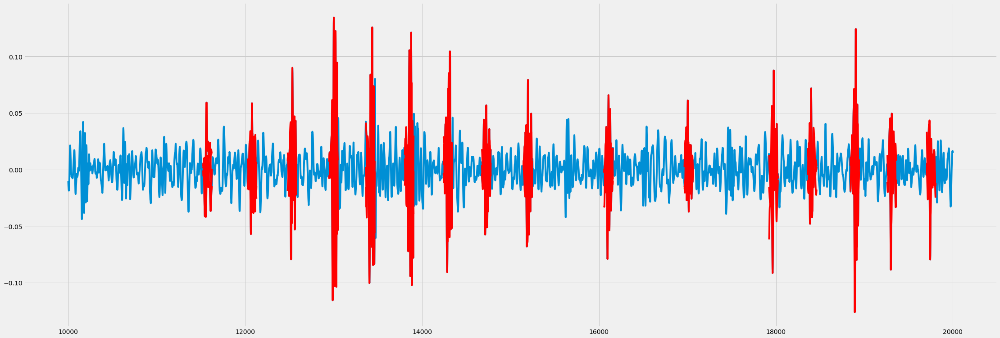

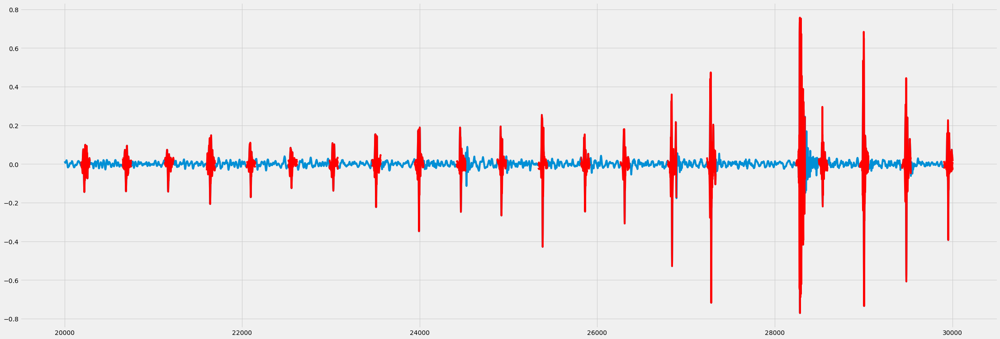

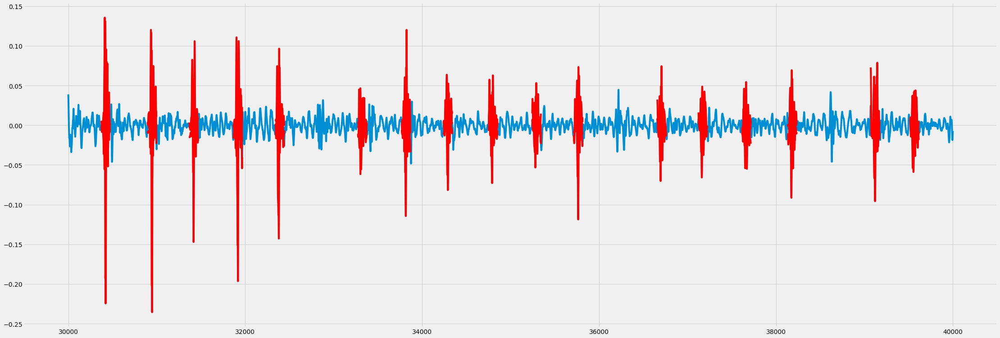

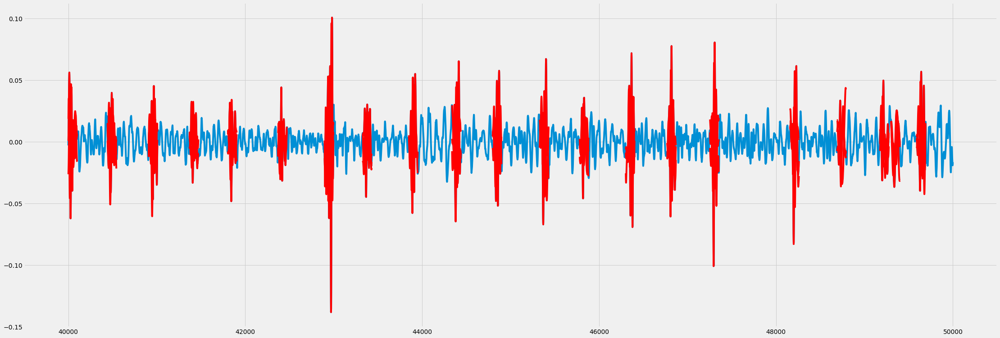

In [47]:
BOUND = [0.045, 0.05, 0.1, 0.05, 0.033]

steps1, rubbish1 = steps_amplitude(BOUND, Data[1], steps1, rubbish1)

In [48]:
len(steps1)

157

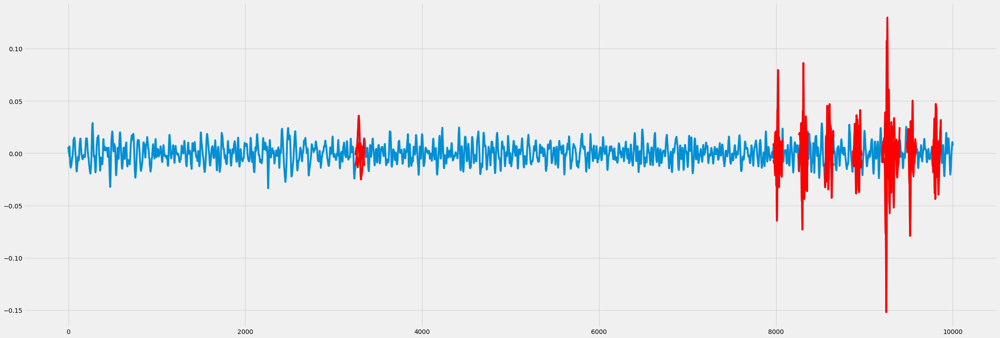

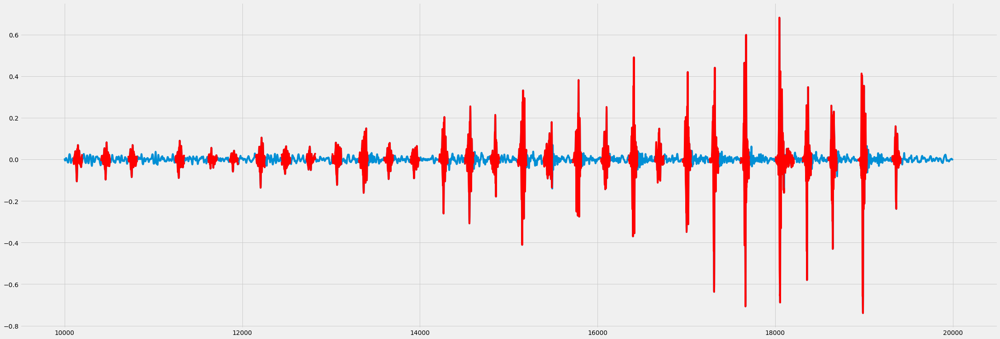

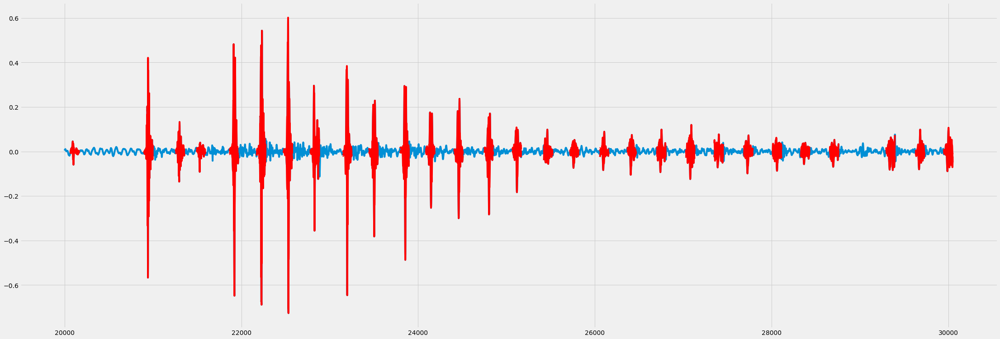

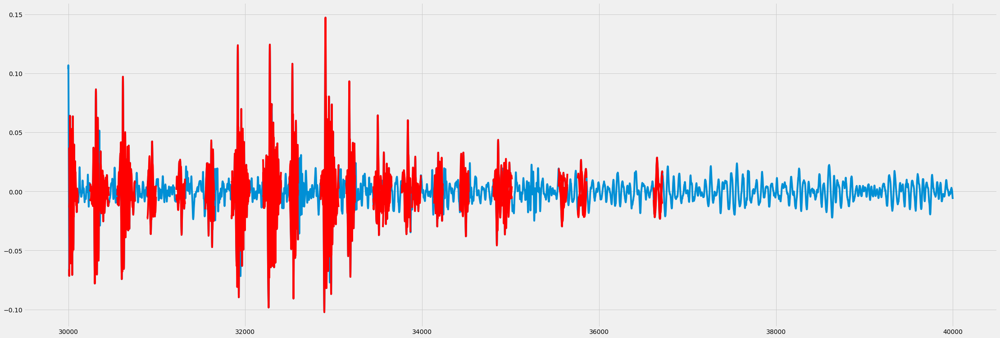

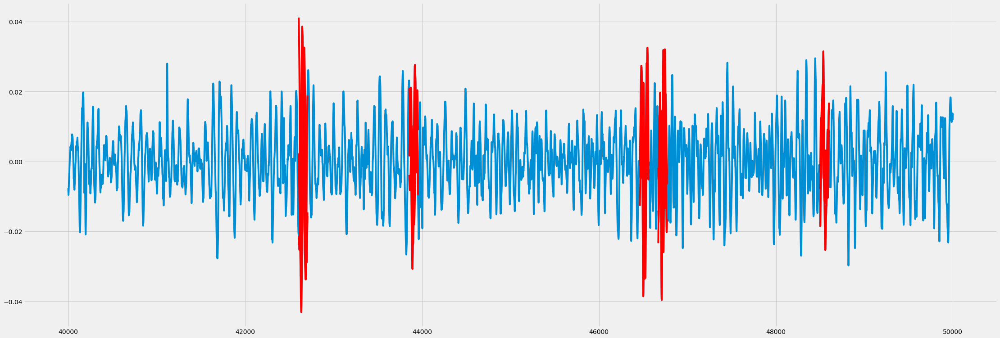

In [49]:
BOUND = [0.035, 0.05, 0.05, 0.025, 0.03]
steps = []
rubbish = []
steps1, rubbish1 = steps_amplitude(BOUND, Data[2], steps1, rubbish1)

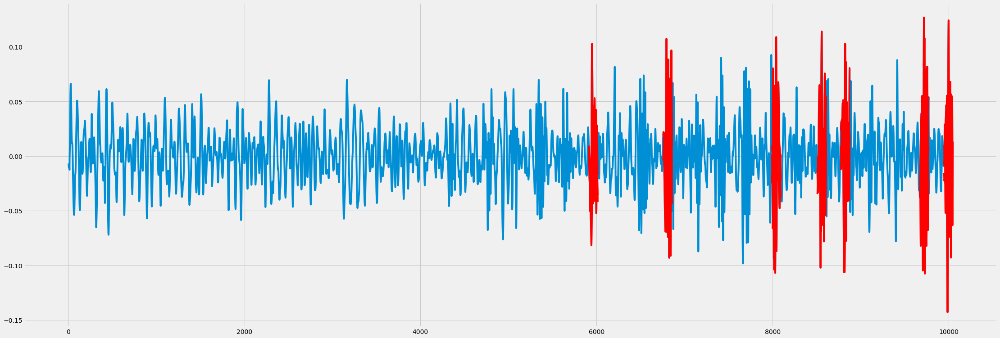

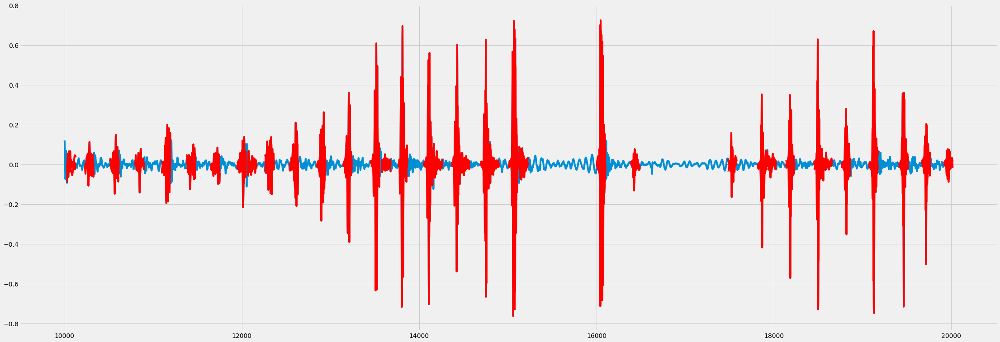

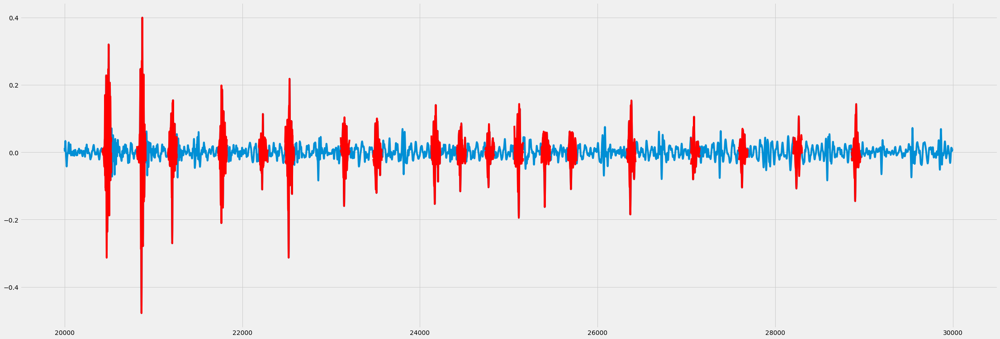

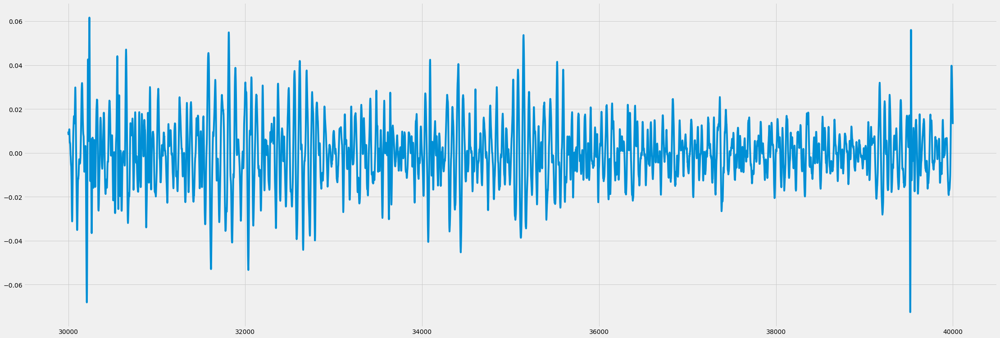

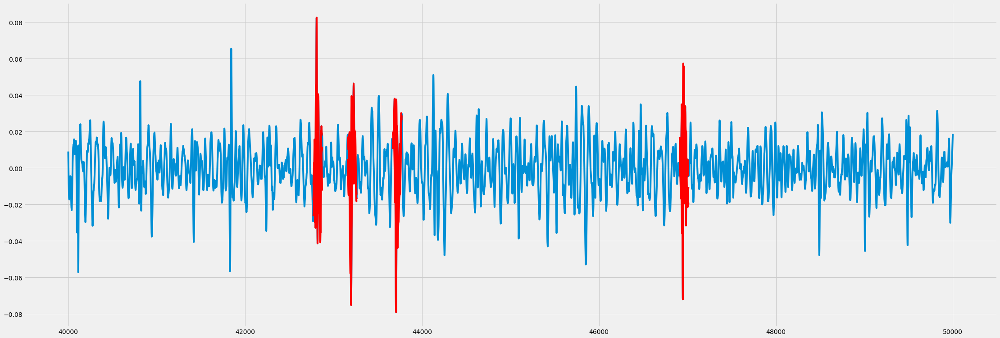

In [50]:
BOUND = [0.1, 0.05, 0.1, 0.1, 0.07]
steps1, rubbish1 = steps_amplitude(BOUND, Data[3], steps1, rubbish1)

In [51]:
len(steps1)

325

In [95]:
steps1[0].shape

(301,)

In [55]:
#steps1 = np.concatenate((steps1, np.ones((len(steps1), 1))), axis = 1) ###Второй раз не запускать
#rubbish1 = np.concatenate((rubbish1, np.zeros((len(rubbish1), 1))), axis = 1)
dataset1 = np.concatenate((steps1, rubbish1), axis = 0)
np.random.shuffle(dataset1)

In [56]:
dataset1.shape

(650, 301)

In [57]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Reshape, GlobalAveragePooling1D
from keras.layers import Conv2D, MaxPooling2D, Conv1D, MaxPooling1D
from keras.utils import np_utils
import keras.backend as K
import warnings
warnings.filterwarnings('ignore')

In [58]:
K.clear_session()
model = Sequential()
model.add(Dense(50, activation='tanh', input_dim=300))
model.add(Dense(50, activation='tanh'))
#model.add(Dropout(0.2))
model.add(Dense(2, activation='softmax'))
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 50)                15050     
_________________________________________________________________
dense_2 (Dense)              (None, 50)                2550      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 102       
Total params: 17,702
Trainable params: 17,702
Non-trainable params: 0
_________________________________________________________________
None


In [59]:
dataset1.shape
datatrain = dataset1[:450]
datatest = dataset1[450:]
y_train_hot = np_utils.to_categorical(datatrain[:, 300], 2)


In [60]:
history = model.fit(datatrain[:, :300],
                      y_train_hot,
                      batch_size=2,
                      epochs=30,   verbose=1)

Epoch 1/30
450/450 [==============================] - 1s 2ms/step - loss: 0.2391 - acc: 0.5467
Epoch 2/30
450/450 [==============================] - 0s 730us/step - loss: 0.2110 - acc: 0.6778
Epoch 3/30
450/450 [==============================] - 0s 711us/step - loss: 0.1972 - acc: 0.7244
Epoch 4/30
450/450 [==============================] - 0s 740us/step - loss: 0.1850 - acc: 0.7511
Epoch 5/30
450/450 [==============================] - 0s 765us/step - loss: 0.1809 - acc: 0.7622
Epoch 6/30
450/450 [==============================] - 0s 659us/step - loss: 0.1731 - acc: 0.7889
Epoch 7/30
450/450 [==============================] - 0s 653us/step - loss: 0.1747 - acc: 0.7756
Epoch 8/30
450/450 [==============================] - 0s 716us/step - loss: 0.1700 - acc: 0.7822
Epoch 9/30
450/450 [==============================] - 0s 751us/step - loss: 0.1722 - acc: 0.7778
Epoch 10/30
450/450 [==============================] - 0s 721us/step - loss: 0.1652 - acc: 0.7844 0s - loss: 0.1570 - acc: 0
Epoc

In [61]:
y_pred_test = model.predict(datatest[:, :300])
ans = []
for i in range(len(y_pred_test)):
    if ( y_pred_test[i,0] > y_pred_test[i,1]):
        ans.append(0)
    else:
        ans.append(1)
s = 0
for i in range(len(y_pred_test)):
    if (ans[i] == datatest[i, 300]):
        s +=1
print('guessed', s, 'from', len(ans), 'probability', s/len(y_pred_test) )

guessed 142 from 200 probability 0.71


In [62]:
Data_new = []
Data_filtered_new = []
for i in range(13,15):
    data = pd.read_csv(f'data\\{i}.csv', sep=';', header = None) 
    data.columns = ["X", "Y", "Y1", "Z"]
    data = data[['X', 'Y', 'Z']]
    Data_new.append(data)

In [76]:
Data_new = []
data = pd.read_csv(f'data\\1.csv', sep=';', header = None)
data.columns = ["X", "Y", "Y1", "Z"]
data = data[['X', 'Y', 'Z']]
Data_new.append(data)

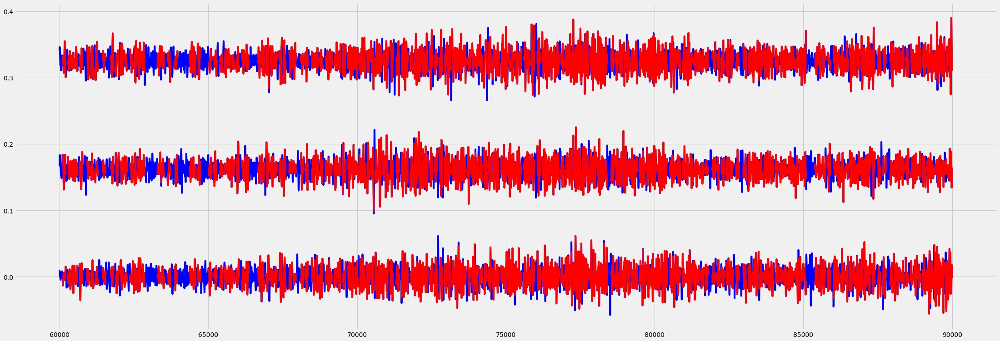

In [78]:
a = 60000
b = 90000

for i in Data_new:
    fig1 = plt.figure(figsize= (30,10))
    axes = fig1.add_axes([0.2,0.1,1,1])
    axes.plot( data.X[a: b], c = 'b')
    axes.plot( data.Y[a: b]+max(abs(data.X[a: b])+0.1), c='b')
    axes.plot( data.Z[a: b]+max(data.Y[a: b]+0.2+max(abs(data.X[a: b]))), c ='b')
    k = a
    while( k < b ):
        p = np.array(np.concatenate( (data.X[k: k+100], data.Y[k:k+100], data.Z[k:k+100]), axis =  0)).reshape(1,-1)
        p= model.predict(p)
        if( p[0,0] < p[0,1]):
            axes.plot( data.X[k: k+100], c ='r')
            axes.plot( data.Y[k: k+100]+max(abs(data.X[a: b])+0.1), c ='r')
            axes.plot( data.Z[k: k+100]+max(data.Y[a: b]+0.2+max(abs(data.X[a: b]))), c ='r')
            #axes.scatter(k+50, p[0, 1], marker = "o", c="g", zorder=20 )
            k +=100
        k += 10
        

In [ ]:
k = 11900
data = Data_new[0]
p = np.array(np.concatenate( (data.X[k: k+100], data.Y[k:k+100], data.Z[k:k+100]), axis =  0)).reshape(1,-1)
p= model.predict(p)
p


# ===========================================================

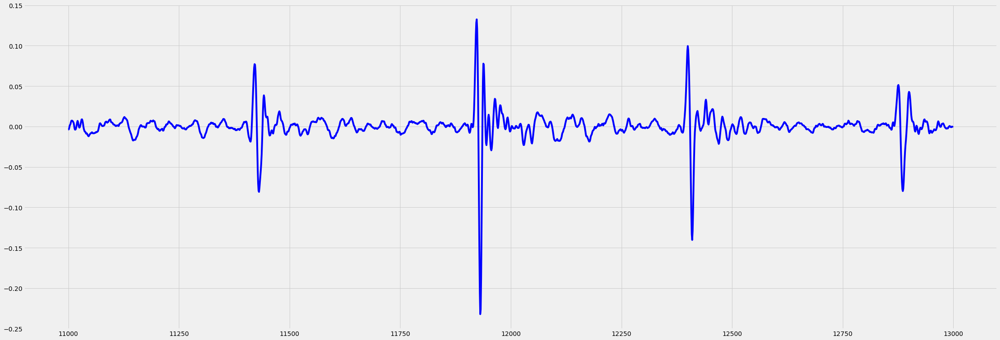

In [87]:
data = pd.read_csv(f'data\\12.csv', sep=';', header = None)
data.columns = ["X", "Y", "Y1", "Z"]
data = data[['X', 'Y', 'Z']]
a = 11000
b = 13000
fig1 = plt.figure(figsize= (30,10))
axes = fig1.add_axes([0.2,0.1,1,1])
axes.plot( data.Z[a: b], c = 'b')

In [ ]:
fig1 = plt.figure(figsize= (30,10))
fig2 = plt.figure(figsize= (30,10))
axes = fig1.add_axes([0.2,0.1,1,1])
axes1 = fig2.add_axes([0.2,0.1,1,1])

axes.plot(Data_new[0].Z[0:5000])
axes1.plot(Data_new[1].Z[14000:17000])
plt.scatter(15000, 1, color = "r")
#Data_new[1][5000:26000]

In [ ]:
#Data_new[0] = np.array(Data_new[0])
#Data_new[1] = np.array(Data_new[1])
#Data_new[0] = np.delete(Data_new[0], list(range(15000)))

In [ ]:
Data_new[1].shape

In [ ]:
Data_filtered = []
y = []
x = []
data= Data[3]
for step in range(5, 70, 5):
    Data_filtered.append(butter_bandpass_filter(data.Z, step, step+10, fs, order=1))
    temp = np.array(Data_filtered[int(step/5)-1])
    y.append(max(temp[20000:25000])/temp[20000:25000].mean())
    x.append(step/5)
    print(temp[20000:25000].mean())
plt.plot(x,y)


In [ ]:
Data_filtered = [] 
for data in Data:
    Data_filtered.append(butter_bandpass_filter(scale(data.Z), 35, 45, fs, order=1))


In [ ]:
Data_filtered_new = [] 
for data in Data_new:
    Data_filtered_new.append(butter_bandpass_filter(scale(data.Z), 35, 45, fs, order=1))

In [ ]:
steps = []
rubbish = []
step_pos = []
for data in Data_filtered:
    BOUND = max(np.array(data)[20000:25000])/8
    #print(BOUND)
    i = 35
    while( i < len(data)):        
        temp = np.array(data[i:i+100])
        if( max(temp) > BOUND):
            r = np.argmax(temp)
            steps.append(data[i+r-35:i+r+65])
            #print(np.argmax(np.array(data[i+r-35:i+r+65])))
            rubbish.append(data[i+r+70:i+r+170])
            step_pos.append(i+r) 
            #print('ii',i)
            i=i+r+100
        i+=1        
    print(len(steps))
    

In [ ]:
fig1 = plt.figure(figsize= (30,20))
axes = fig1.add_axes([0.2,0.1,1,1])

axes.plot(Data_filtered[0][36000:37000])
list = []
for i in range(1000):
    list.append(BOUND)

axes.plot(range(1000), list )
steps = []
rubbish = []
step_pos = []
data = Data_filtered[0][36000:37000]
i = 35
while( i < len(data)):        
    temp = np.array(data[i:i+100])
    if( max(temp) > BOUND):
        r = np.argmax(temp)
        axes.plot(range(i+r-35,i+r+80),data[i+r-35:i+r+80], c='r')
        i=i+r+100
    i+=1        



In [ ]:
fig1 = plt.figure(figsize= (30,20))
axes = fig1.add_axes([0.2,0.1,1,1])
axes.plot(data[1000:2000])

In [ ]:
Data_filtered[0].shape

In [ ]:
fig1 = plt.figure(figsize= (30,20))

axes = fig1.add_axes([0.2,0.1,1,1])


axes.plot(Data_filtered[0])
#axes1.plot(Data_new[1].Z[14000:17000])
step_pos = np.array(step_pos)
plt.scatter([step_pos[:39]], (np.zeros[[39, 1]]), c="r", zorder=20)

In [ ]:
fig1 = plt.figure(figsize= (30,10))
axes = fig1.add_axes([0.2,0.1,1,1])
list = []
for i in range(15000):
    list.append(BOUND)

axes.plot(Data_filtered[0][:15000])
axes.plot(range(15000), list )

In [ ]:
steps_new = []
rubbish_new = []
centres = []
for data in Data_filtered_new:
    BOUND = max(np.array(data)[20000:25000])/1.3
    i = 35
    while( i < len(data)): 
        
        temp = np.array(data[i:i+100])
        if( max(temp) > BOUND):
            r = np.argmax(temp)
            steps_new.append(data[i+r-35:i+r+65])
            #print(np.argmax(np.array(data[i+r-35:i+r+65])))
            rubbish_new.append(data[i+r+70:i+r+170])
            centres.append(i+r)
            #print('ii',i)
            i=i+r+100
        i+=1        
    print(len(steps_new))

In [ ]:
for i in steps[:30]:
    fig = plt.figure(figsize= (30,10))
    axes = fig.add_axes([0.1,0.1,1,1])
    axes.plot(i)
    

In [ ]:
import seaborn as sns
from scipy import stats

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
from sklearn.preprocessing import scale

import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Reshape, GlobalAveragePooling1D
from keras.layers import Conv2D, MaxPooling2D, Conv1D, MaxPooling1D
from keras.utils import np_utils
import keras.backend as K

In [ ]:
steps = np.array(steps)
steps_new = np.array(steps_new)
rubbish_new = np.array(rubbish_new)

In [ ]:
steps1 = np.concatenate((steps, np.ones((120, 1))), axis = 1)
rubbish1 = np.concatenate((rubbish, np.zeros((120, 1))), axis = 1)
dataset1 = np.concatenate((steps1, rubbish1), axis = 0)
np.random.shuffle(dataset1)

In [ ]:
dataset1.shape

In [ ]:
K.clear_session()
model = Sequential()
model.add(Dense(50, activation='tanh', input_dim=100))
model.add(Dense(50, activation='tanh'))
model.add(Dense(2, activation='softmax'))
print(model.summary())
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
dataset1 = scale(dataset1)
y_train_hot = np_utils.to_categorical(dataset1[:200, 100], 2)
history = model.fit(dataset1[:200, :100],
                      y_train_hot,
                      batch_size=2,
                      epochs=20,   verbose=1)

In [ ]:
y_pred_test = model.predict(dataset1[200:, :100])

In [ ]:
ans = []
for i in range(40):
    if ( y_pred_test[i,0] > y_pred_test[i,1]):
        ans.append(0)
    else:
        ans.append(1)
for i in range(len(ans)):
    if( ans[i] == dataset1[200+i, 100] ):
        print ( str(ans[i]) + str(dataset1[200+i, 100]) + 'good')
    else:
        print ( str(ans[i]) + str(dataset1[200+i, 100]) + 'bad')

In [ ]:
steps_new = np.array(steps_new)
rubbish_new = np.array(rubbish_new)
y_pred_test_misha = model.predict(steps_new)
y_pred_test_misha_tr = model.predict(rubbish_new)


In [ ]:
centres = np.array(centres)
pred3 = np.array(y_pred_test_misha[7:,1])
cent3 = centres[7:]

In [ ]:
ans = []
for i in range(len(steps_new)):
    if ( y_pred_test_misha[i,0] > y_pred_test_misha[i,1]):
        ans.append(0)
    else:
        ans.append(1)
#for i in range(len(ans)):
 #   if( ans[i] == 1 ):
       # print ( str(ans[i])   + 'good')
    #else:
     #   print ( str(ans[i])   + 'bad')
print(sum(ans))

In [ ]:
N = 42
area = (20 * np.random.rand(N))**2  # 0 to 10 point radii
c = np.sqrt(area)
fig1 = plt.figure(figsize= (30,20))

axes = fig1.add_axes([0.2,0.1,1,1])


axes.plot(Data_new[2].Z[5000:30000])
#axes1.plot(Data_new[1].Z[14000:17000])
plt.scatter([cent3], (np.divide([pred3], 1)-1), marker = "o", c="r", zorder=20)
#plt.scatter([cent3], np.ones(cent3.shape[0]), marker = "o", c="y")

In [ ]:
np.set_printoptions(suppress=True)
list(ress)

In [ ]:
pred3.shape

In [ ]:
def plot_step():
    